In [1]:
%matplotlib inline
import matplotlib.pyplot as plt

from muon.deep_clustering.clustering import Config, Cluster
from muon.utils.subjects import Subjects

import os
import pickle
import math

save_dir = './mnt/dec/dec_output'
subjects = os.path.join(save_dir, 'subjects.pkl')
subjects = pickle.load(open(subjects, 'rb'))
config = Config(**{
    'n_clusters': 10,
    'batch_size': 256,
    'lr': 0.01,
    'momentum': 0.9,
    'tol': 0.001,
    'maxiter': 2e4,
    'update_interval': 140,
    'save_dir':  save_dir,
})

cluster = Cluster.create(subjects, config)
cluster.train()
pred = cluster.predictions

20171201_14:42:03 INFO Initialized logging


/home/michael/Documents/Zooniverse/repos/swap/conf
/home/michael/Documents/Zooniverse/repos/swap/tools/muon/muon_config.conf


Using TensorFlow backend.


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input (InputLayer)           (None, 499)               0         
_________________________________________________________________
encoder_0 (Dense)            (None, 500)               250000    
_________________________________________________________________
encoder_1 (Dense)            (None, 500)               250500    
_________________________________________________________________
encoder_2 (Dense)            (None, 2000)              1002000   
_________________________________________________________________
encoder_3 (Dense)            (None, 10)                20010     
_________________________________________________________________
clustering (ClusteringLayer) (None, 10)                100       
Total params: 1,522,610
Trainable params: 1,522,610
Non-trainable params: 0
_________________________________________________________________


In [2]:
pred.cluster_mapping

,n_assigned,majority_class,majority_class_fraction
0,1747,0,0.969662
1,1307,0,0.881408
2,1717,0,0.973209
3,1521,0,0.961210
4,1697,0,0.971126
5,1599,0,0.956848
6,1649,0,0.967253
7,1544,0,0.942358
8,1429,0,0.893632
9,460,0,1.000000


   n_assigned  majority_class  majority_class_fraction
0        1747               0                 0.969662
number of subjects 1747


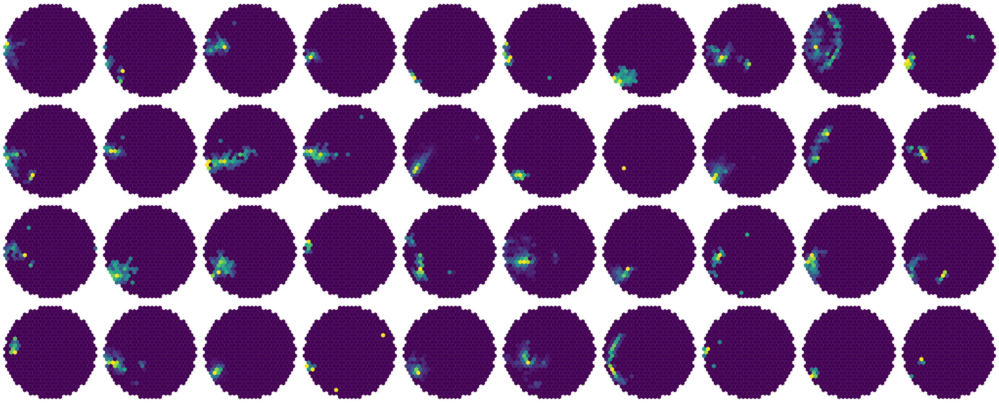

   n_assigned  majority_class  majority_class_fraction
1        1307               0                 0.881408
number of subjects 1307


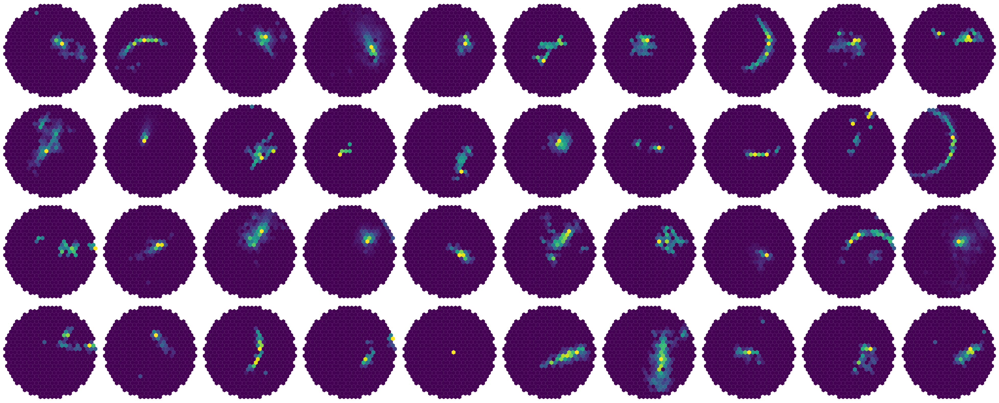

   n_assigned  majority_class  majority_class_fraction
2        1717               0                 0.973209
number of subjects 1717


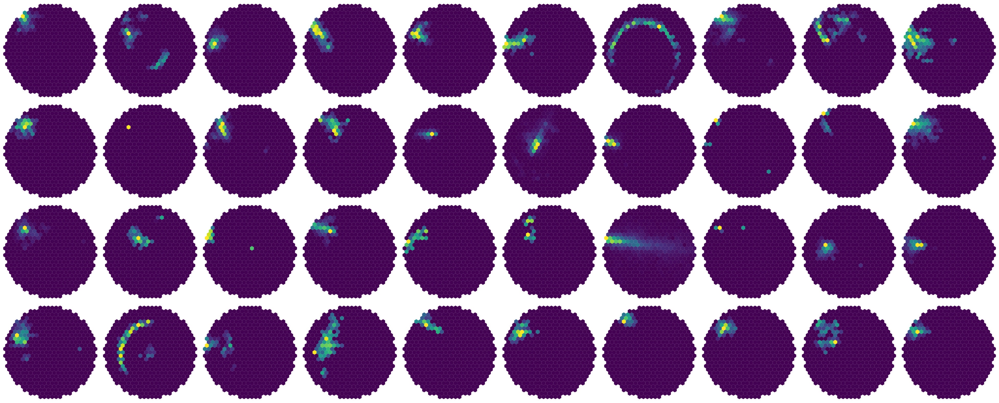

   n_assigned  majority_class  majority_class_fraction
3        1521               0                  0.96121
number of subjects 1521


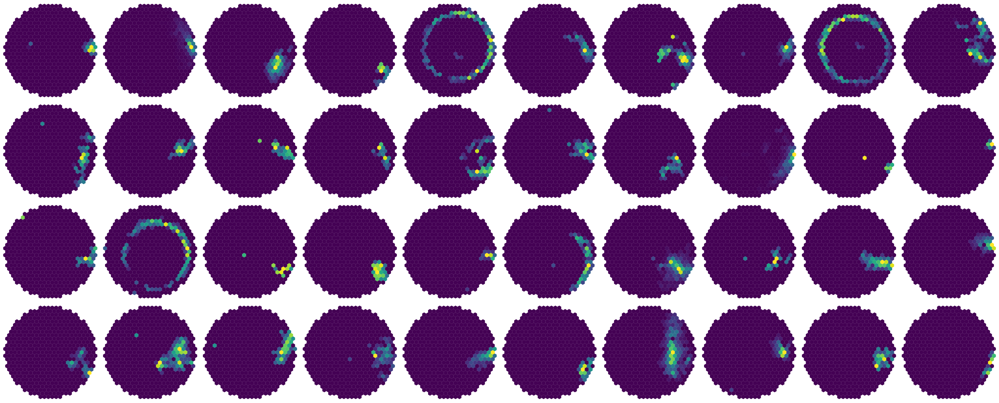

   n_assigned  majority_class  majority_class_fraction
4        1697               0                 0.971126
number of subjects 1697


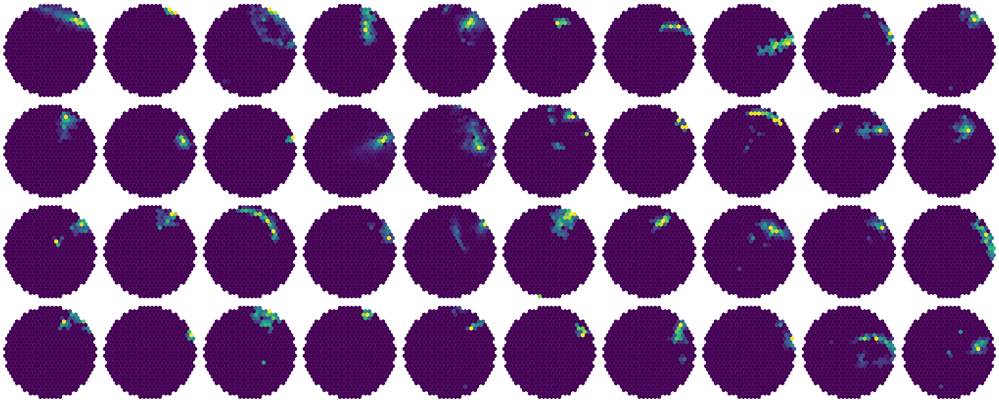

   n_assigned  majority_class  majority_class_fraction
5        1599               0                 0.956848
number of subjects 1599


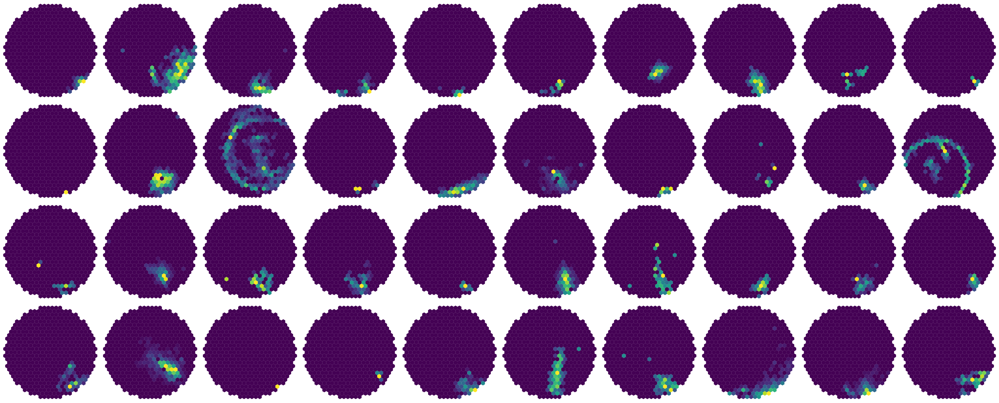

   n_assigned  majority_class  majority_class_fraction
6        1649               0                 0.967253
number of subjects 1649


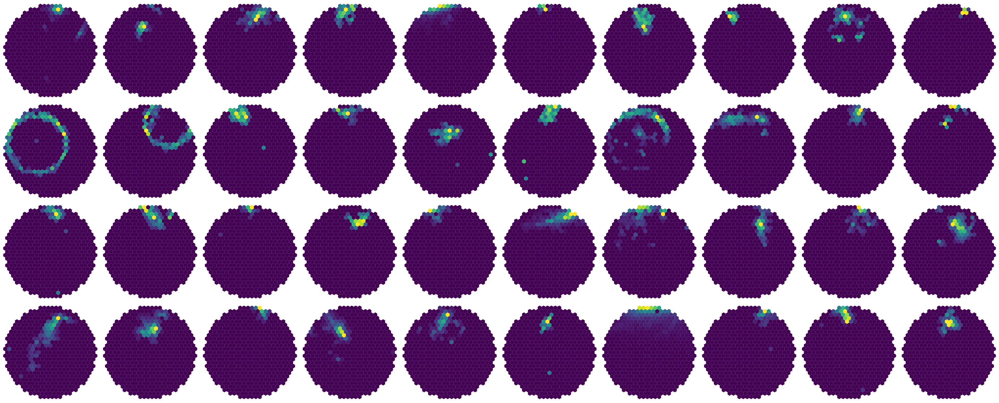

   n_assigned  majority_class  majority_class_fraction
7        1544               0                 0.942358
number of subjects 1544


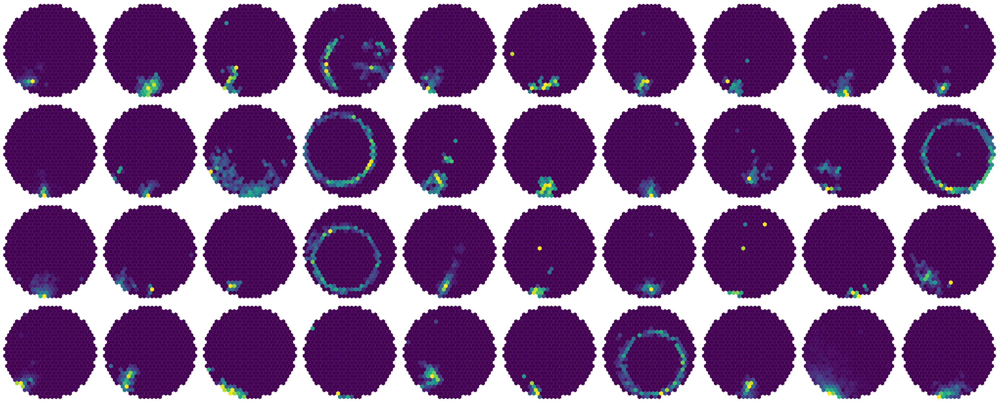

   n_assigned  majority_class  majority_class_fraction
8        1429               0                 0.893632
number of subjects 1429


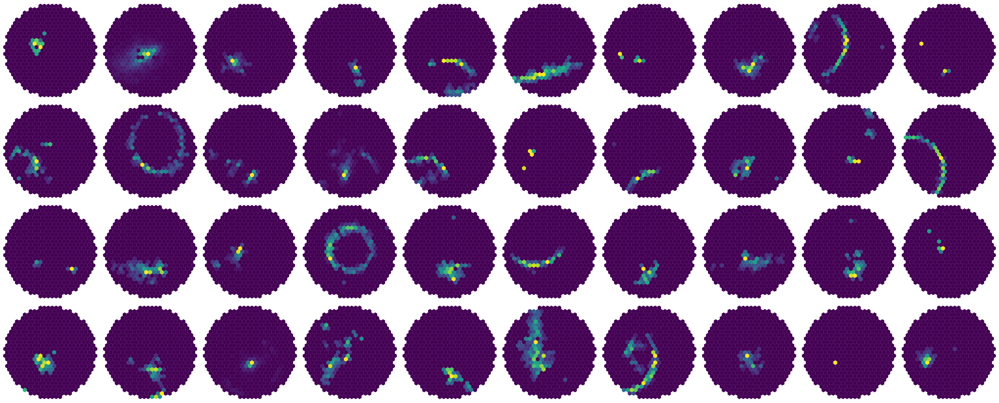

   n_assigned  majority_class  majority_class_fraction
9         460               0                      1.0
number of subjects 460


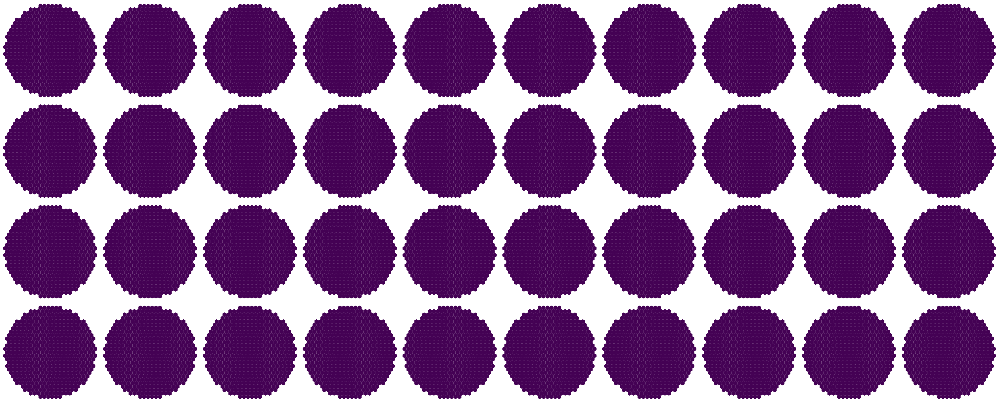

In [3]:
for c in range(config.n_clusters):
    s=pred.cluster_subjects(c)
    print(pred.cluster_mapping.iloc[[c]])
    fig=s.plot_sample(40, w=10)
    plt.show()